#### **Import Modules**

In [1]:
import csv
import numpy as np
import pandas as pd
import collections
import matplotlib.pyplot as plt
#!pip install pyyaml==5.4.1
import plotly.express as px
import time
#!pip install geopandas
import seaborn as sns
from scipy import stats
import statistics
%matplotlib inline
import geopandas as gpd

In [2]:
pip install pandas-profiling

In [3]:
!pip install MarkupSafe==2.0.1 --user

#### **Import Dataset and Generate Prelimiary Reports**

In [3]:
Dist_df_1=pd.read_csv("02_01_District_wise_crimes_committed_against_SC_2001_2012.csv")
Dist_df_2=pd.read_csv("02_01_District_wise_crimes_committed_against_SC_2013.csv")

Dist_df_crimes_final=pd.concat([Dist_df_1,Dist_df_2])
Dist_df_crimes_final

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,4,0,0,0,3,0,15,32
1,ANDHRA PRADESH,ANANTAPUR,2001,0,4,0,0,0,0,49,21,0,53
2,ANDHRA PRADESH,CHITTOOR,2001,3,3,0,0,0,0,38,36,0,34
3,ANDHRA PRADESH,CUDDAPAH,2001,0,3,0,0,0,0,20,52,0,25
4,ANDHRA PRADESH,EAST GODAVARI,2001,1,3,0,0,0,0,3,12,63,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
818,Lakshadweep,LAKSHADWEEP,2013,0,0,0,0,0,0,0,0,0,0
819,Lakshadweep,TOTAL,2013,0,0,0,0,0,0,0,0,0,0
820,Puducherry,KARAIKAL,2013,0,1,0,0,0,0,0,0,3,0
821,Puducherry,PUDUCHERRY,2013,0,0,0,0,0,0,0,4,12,1


In [4]:
Dist_df_crimes_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9841 entries, 0 to 822
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype 
---  ------                                --------------  ----- 
 0   STATE/UT                              9841 non-null   object
 1   DISTRICT                              9841 non-null   object
 2   Year                                  9841 non-null   int64 
 3   Murder                                9841 non-null   int64 
 4   Rape                                  9841 non-null   int64 
 5   Kidnapping and Abduction              9841 non-null   int64 
 6   Dacoity                               9841 non-null   int64 
 7   Robbery                               9841 non-null   int64 
 8   Arson                                 9841 non-null   int64 
 9   Hurt                                  9841 non-null   int64 
 10  Prevention of atrocities (POA) Act    9841 non-null   int64 
 11  Protection of Civil Rights (PCR

In [5]:
from pandas_profiling import ProfileReport

C:\Users\Vipinchi Nidhi\anaconda3\Lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\Vipinchi Nidhi\anaconda3\Lib\site-packages\visions\backends\shared\nan_handling.py:50: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @nb.jit
C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_4456\2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1

In [6]:
profile=ProfileReport(Dist_df_crimes_final, title="’Crimes against SC’", html={"style":{"full_width":True}})

In [7]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
profile.to_file(output_file="Crimes_Against_SC_2001_2013")

C:\Users\Vipinchi Nidhi\anaconda3\Lib\site-packages\ydata_profiling\profile_report.py:360: UserWarning: Extension  not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### **Check for the presence of 'NULL'  in the data**

In [9]:
Dist_df_crimes_final.isnull().sum()

STATE/UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping and Abduction                0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Prevention of atrocities (POA) Act      0
Protection of Civil Rights (PCR) Act    0
Other Crimes Against SCs                0
dtype: int64

#### **Dataset Minor Modifications**

In [10]:
Dist_df_crimes_final.shape

(9841, 13)

In [11]:
for x in Dist_df_crimes_final["DISTRICT"].unique():
    if "total" in str(x).lower():
        Dist_df_crimes_final=Dist_df_crimes_final.drop(list(Dist_df_crimes_final[Dist_df_crimes_final["DISTRICT"]==x].index))

In [12]:
Dist_df_crimes_final

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,4,0,0,0,3,0,15,32
1,ANDHRA PRADESH,ANANTAPUR,2001,0,4,0,0,0,0,49,21,0,53
2,ANDHRA PRADESH,CHITTOOR,2001,3,3,0,0,0,0,38,36,0,34
3,ANDHRA PRADESH,CUDDAPAH,2001,0,3,0,0,0,0,20,52,0,25
4,ANDHRA PRADESH,EAST GODAVARI,2001,1,3,0,0,0,0,3,12,63,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
815,Delhi UT,STF,2013,0,0,0,0,0,0,0,0,0,0
816,Delhi UT,WEST,2013,0,0,0,0,0,0,0,3,1,0
818,Lakshadweep,LAKSHADWEEP,2013,0,0,0,0,0,0,0,0,0,0
820,Puducherry,KARAIKAL,2013,0,1,0,0,0,0,0,0,3,0


In [13]:
Dist_df_crimes_final.shape

(9312, 13)

In [14]:
#add Cols
Dist_df_crimes_final["Total"]=Dist_df_crimes_final["Murder"]
for x in range(4,len(Dist_df_crimes_final.columns)-1):
    Dist_df_crimes_final["Total"]+=Dist_df_crimes_final[Dist_df_crimes_final.columns[x]]

In [15]:
Dist_df_crimes_final

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,Total
0,ANDHRA PRADESH,ADILABAD,2001,0,1,4,0,0,0,3,0,15,32,55
1,ANDHRA PRADESH,ANANTAPUR,2001,0,4,0,0,0,0,49,21,0,53,127
2,ANDHRA PRADESH,CHITTOOR,2001,3,3,0,0,0,0,38,36,0,34,114
3,ANDHRA PRADESH,CUDDAPAH,2001,0,3,0,0,0,0,20,52,0,25,100
4,ANDHRA PRADESH,EAST GODAVARI,2001,1,3,0,0,0,0,3,12,63,7,89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
815,Delhi UT,STF,2013,0,0,0,0,0,0,0,0,0,0,0
816,Delhi UT,WEST,2013,0,0,0,0,0,0,0,3,1,0,4
818,Lakshadweep,LAKSHADWEEP,2013,0,0,0,0,0,0,0,0,0,0,0
820,Puducherry,KARAIKAL,2013,0,1,0,0,0,0,0,0,3,0,4


In [16]:
Dist_df_crimes_final.shape

(9312, 14)

#### **General Geomap Observation**

In [17]:
df_geo_total=Dist_df_crimes_final[['STATE/UT','Total']]
df_geo_total

,STATE/UT,Total
0,ANDHRA PRADESH,55
1,ANDHRA PRADESH,127
2,ANDHRA PRADESH,114
3,ANDHRA PRADESH,100
4,ANDHRA PRADESH,89
...,...,...
815,Delhi UT,0
816,Delhi UT,4
818,Lakshadweep,0
820,Puducherry,4


In [18]:
shp_gdf = gpd.read_file("India_State_Boundary.shp")

In [19]:
shp_gdf.head(5)

,State_Name,geometry
0,Andaman & Nicobar,"MULTIPOLYGON (((10341718.474 1449533.161, 1034..."
1,Chandigarh,"POLYGON ((8546255.616 3606050.813, 8546315.400..."
2,Daman and Diu and Dadra and Nagar Haveli,"MULTIPOLYGON (((8122247.822 2312434.407, 81223..."
3,Delhi,"POLYGON ((8583390.570 3359116.190, 8583476.212..."
4,Haryana,"POLYGON ((8524318.539 3516490.865, 8524451.392..."


In [20]:
shp_gdf.columns

Index(['State_Name', 'geometry'], dtype='object')

In [21]:
merge =shp_gdf.set_index('State_Name').join(df_geo_total.set_index('STATE/UT'))
merge

,geometry,Total
Andaman & Nicobar,"MULTIPOLYGON (((10341718.474 1449533.161, 1034...",NaN
Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",70.0
Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",117.0
Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",97.0
Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",176.0
...,...,...
West Bengal,"POLYGON ((9800305.279 3151090.311, 9800377.779...",19.0
West Bengal,"POLYGON ((9800305.279 3151090.311, 9800377.779...",1.0
West Bengal,"POLYGON ((9800305.279 3151090.311, 9800377.779...",0.0
West Bengal,"POLYGON ((9800305.279 3151090.311, 9800377.779...",0.0


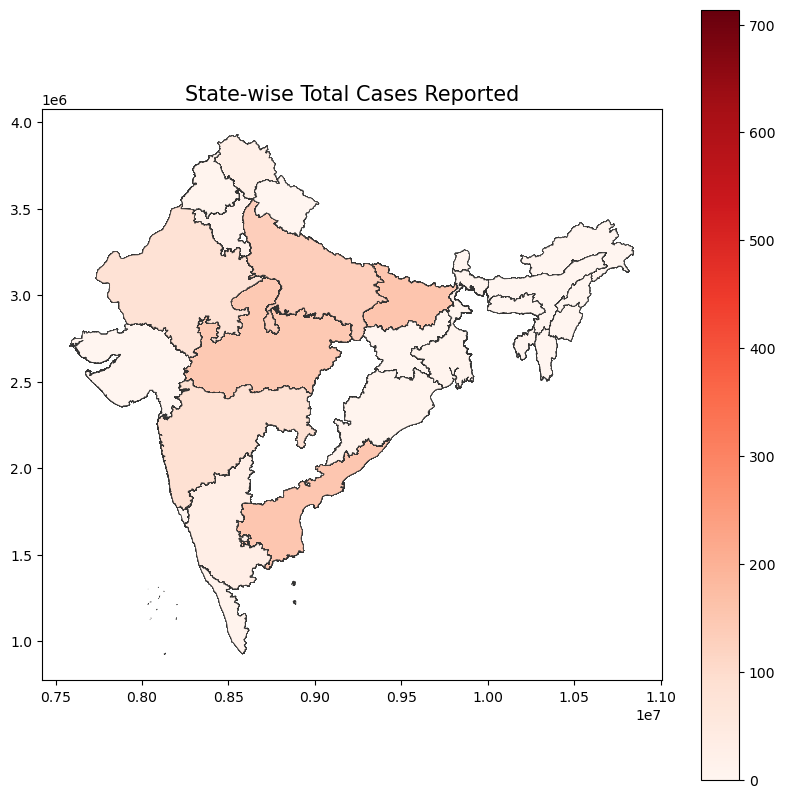

In [22]:
fig,ax=plt.subplots(1, figsize=(10,10))

ax.set_title('State-wise Total Cases Reported',
             fontdict={'fontsize': '15', 'fontweight' : '3'})
fig = merge.plot(column='Total', cmap='Reds', linewidth=0.5, ax=ax, edgecolor='0.2',legend=True)
plt.show()

#### **Yearly Analysis**

Text(0.5, 1.0, 'No of Cases vs Year')

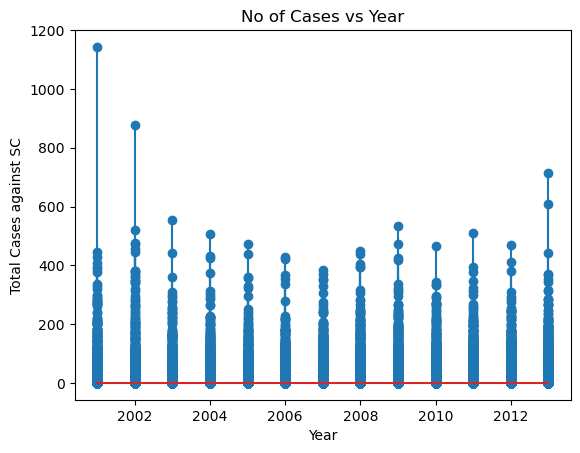

In [23]:
plt.stem(Dist_df_crimes_final.Year,Dist_df_crimes_final.Total)
plt.ylabel('Total Cases against SC')   
plt.xlabel('Year')
plt.title('No of Cases vs Year')

<Axes: xlabel='Year'>

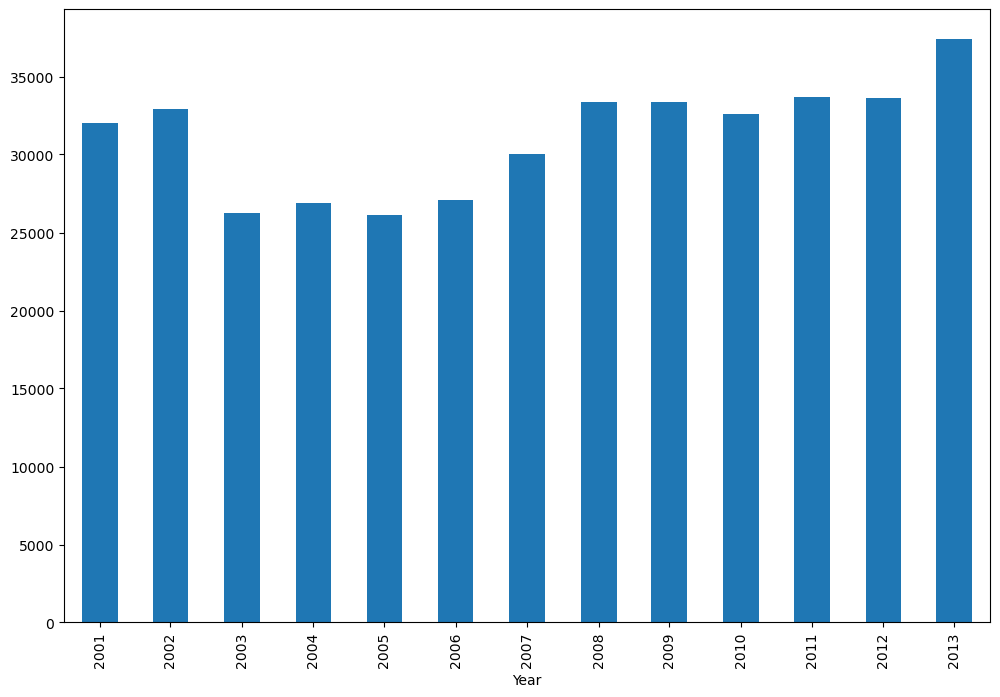

In [24]:
plt.figure(figsize=(12,8))
Dist_df_crimes_final.groupby("Year")["Total"].sum().plot.bar()

C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_4456\3044060855.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='bar', y=Dist_df_crimes_final.columns[col])
C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_4456\3044060855.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='pie', y=Dist_df_crimes_final.columns[col],explode=explode,figsize=(7,7),autopct='%1.0f%%')
C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_4456\3044060855.py:3: FutureWarning: The default value of numeric_only in D

C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_4456\3044060855.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='pie', y=Dist_df_crimes_final.columns[col],explode=explode,figsize=(7,7),autopct='%1.0f%%')
C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_4456\3044060855.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='bar', y=Dist_df_crimes_final.columns[col])
C:\Users\Vipinchi Nidhi\anaconda3\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figure

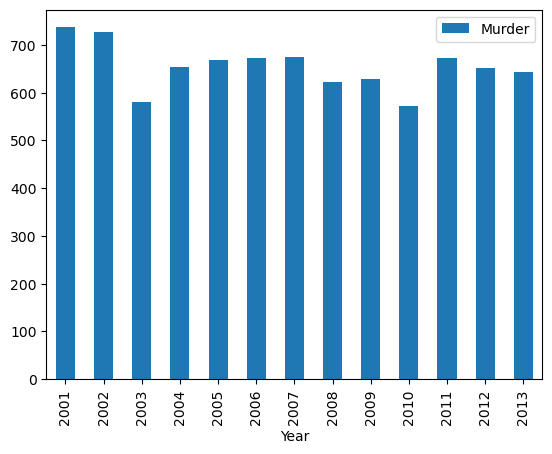

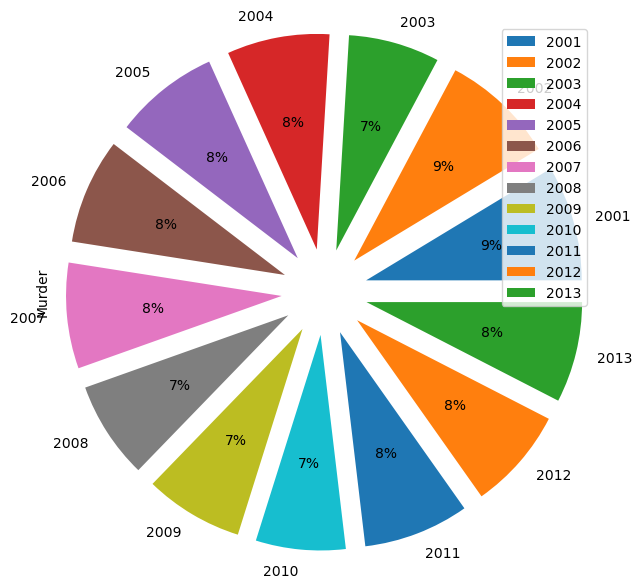

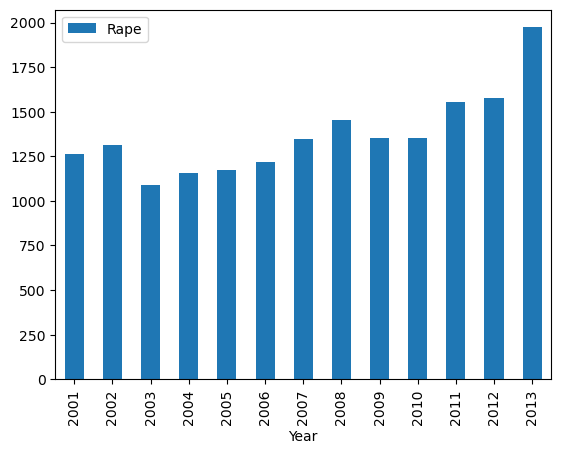

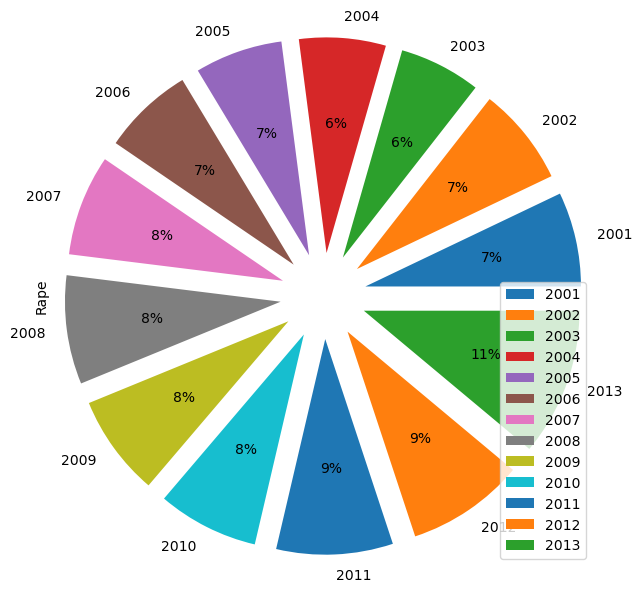

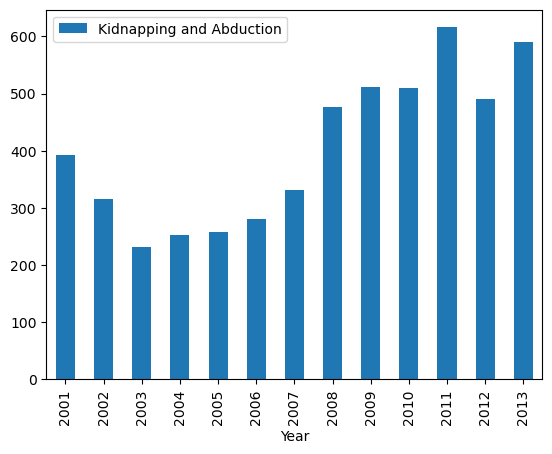

...

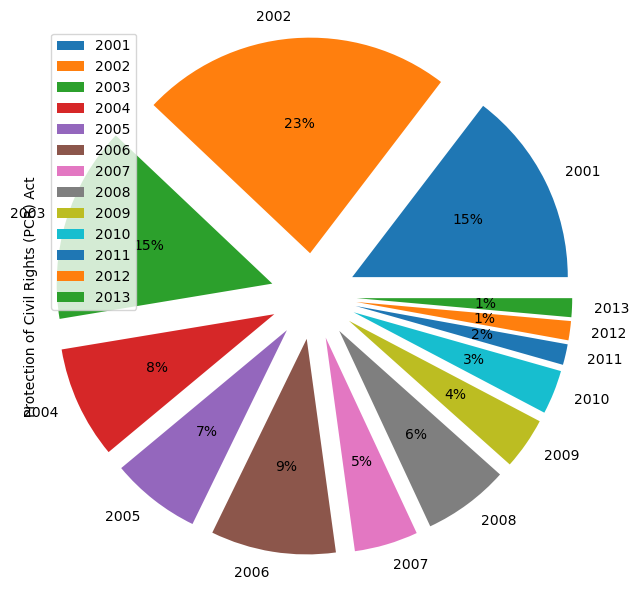

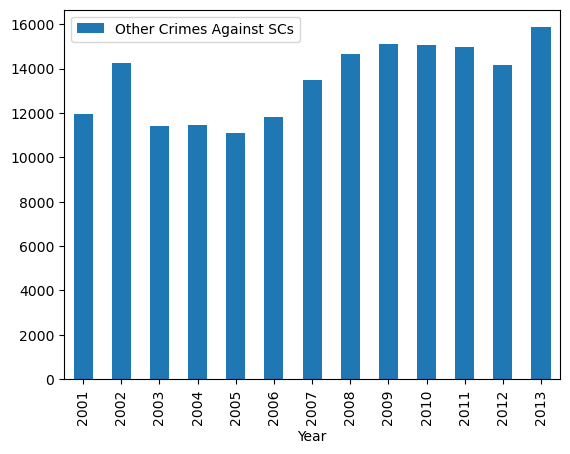

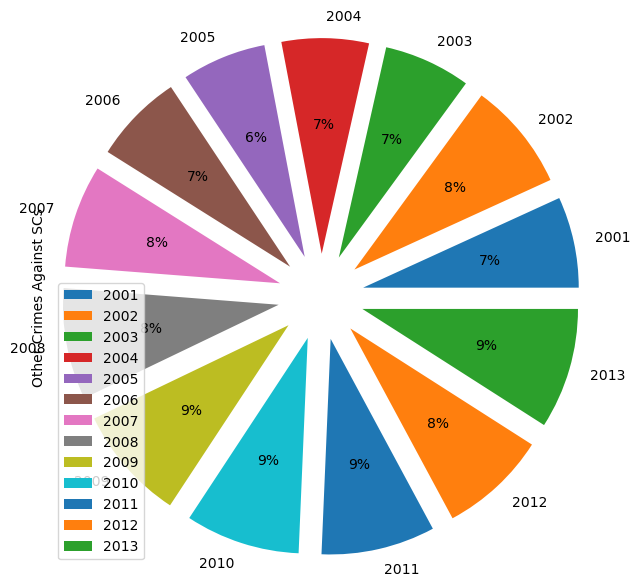

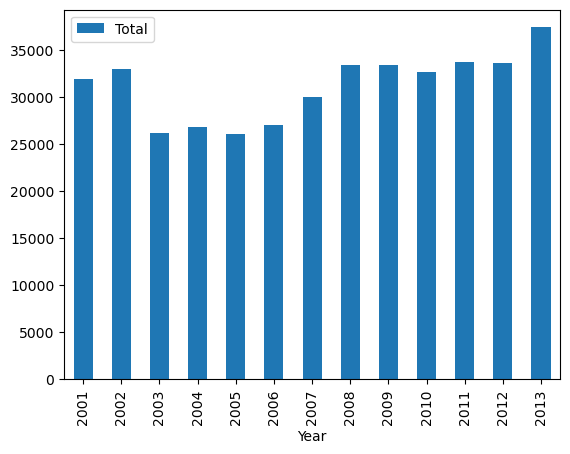

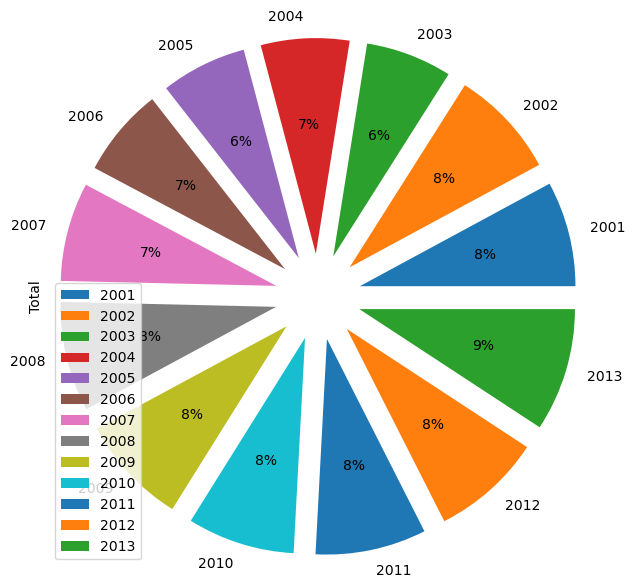

In [25]:
explode=[0.2 for x in range(len(Dist_df_crimes_final['Year'].unique()))]
for col in range(3,len(Dist_df_crimes_final.columns)):
    Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='bar', y=Dist_df_crimes_final.columns[col])
    Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='pie', y=Dist_df_crimes_final.columns[col],explode=explode,figsize=(7,7),autopct='%1.0f%%')

### Categorical yearly crime rates

In [26]:
crimes=Dist_df_crimes_final.columns[3:-1]
Dist_df_crimes_sub=pd.DataFrame()
for i in crimes:
    df_c=Dist_df_crimes_final.groupby(['Year'])[i].sum()
    Dist_df_crimes_sub[i]=df_c
Dist_df_crimes_sub

,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs
Year,,,,,,,,,,
2001,737,1263,392,40,132,337,4283,12224,631,11953
2002,728,1312,315,29,104,322,4321,10584,1007,14264
2003,581,1089,232,24,70,204,3969,8048,634,11399
2004,654,1157,253,26,72,211,3824,8892,364,11435
2005,669,1172,258,26,80,210,3847,8497,291,11077
2006,673,1218,280,30,90,226,3762,8581,405,11811
2007,674,1349,332,23,86,238,3814,9819,206,13490
2008,622,1453,477,50,81,224,4134,11465,279,14645
2009,629,1350,511,42,67,195,4322,11037,168,15091


### Percentage Distribution of crime type

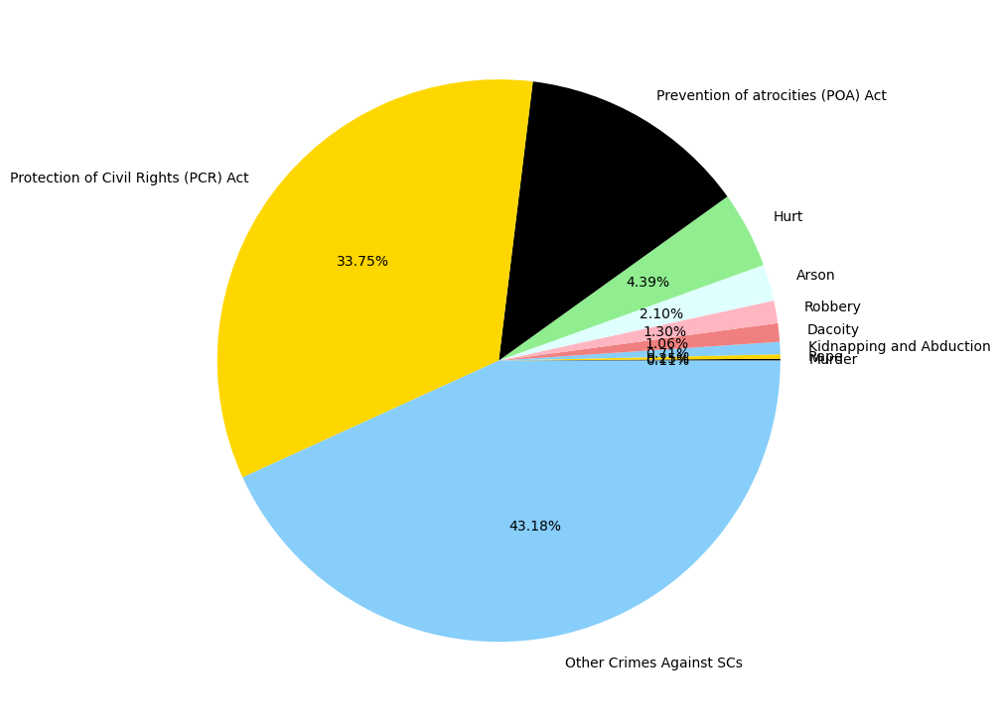

In [27]:
a=[]
explode=[]
for i in crimes:
    a.append(Dist_df_crimes_sub[i].sum())
    explode.append(0.4)
a.sort()
plt.figure(figsize=(10,10))
plt.pie(a,labels=crimes,autopct='%1.2f%%',data=explode,colors=['black', 'gold', 'lightskyblue', 'lightcoral','lightpink','lightcyan','lightgreen'])
plt.tight_layout()

In [28]:
Dist_df_crimes_sub.T

Year,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Murder,737,728,581,654,669,673,674,622,629,572,673,651,643
Rape,1263,1312,1089,1157,1172,1218,1349,1453,1350,1350,1557,1576,1974
Kidnapping and Abduction,392,315,232,253,258,280,332,477,511,510,616,490,591
Dacoity,40,29,24,26,26,30,23,50,42,41,36,27,43
Robbery,132,104,70,72,80,90,86,81,67,75,54,40,61
Arson,337,322,204,211,210,226,238,224,195,150,169,214,175
Hurt,4283,4321,3969,3824,3847,3762,3814,4134,4322,4344,4247,3855,4632
Prevention of atrocities (POA) Act,12224,10584,8048,8892,8497,8581,9819,11465,11037,10419,11352,12576,13421
Protection of Civil Rights (PCR) Act,631,1007,634,364,291,405,206,279,168,143,67,62,61
Other Crimes Against SCs,11953,14264,11399,11435,11077,11811,13490,14645,15091,15039,14957,14164,15860


## State / UT wise Analysis of Crime

<Axes: xlabel='STATE/UT'>

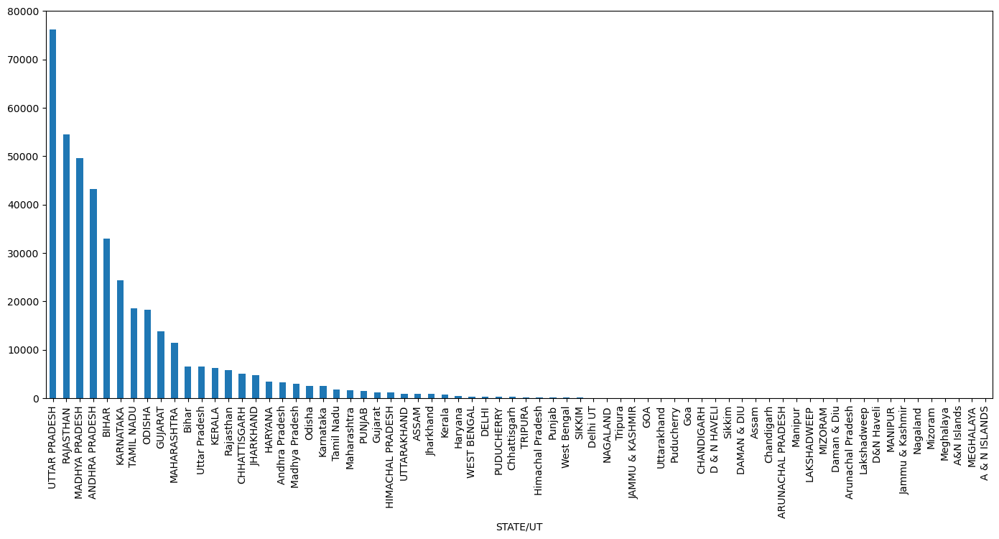

In [29]:
plt.figure(figsize=(17,7))
Dist_df_crimes_final.groupby("STATE/UT")["Total"].sum().sort_values(ascending=False).plot.bar()

In [30]:
df_state=pd.DataFrame()
for i in crimes:
    df_state_crimes=Dist_df_crimes_final.groupby(['STATE/UT'])[i].sum()
    df_state[i]=df_state_crimes
df_state["Total"]=df_state.sum(axis=1)
df_state=df_state.sort_values(by="Total",ascending=False)
df_state.reset_index()
df_state

,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,Total
STATE/UT,,,,,,,,,,,
UTTAR PRADESH,3569,3618,2223,55,214,710,4868,26248,501,34223,76229
RAJASTHAN,628,1893,365,1,33,475,5982,7511,7,37653,54548
MADHYA PRADESH,1059,4100,510,9,96,445,9989,2779,11,30644,49642
ANDHRA PRADESH,555,1104,235,9,38,136,7219,15111,1501,17354,43262
BIHAR,276,270,127,29,77,309,4383,23288,465,3753,32977
...,...,...,...,...,...,...,...,...,...,...,...
Mizoram,0,0,0,0,0,0,0,0,0,0,0
Meghalaya,0,0,0,0,0,0,0,0,0,0,0
A&N Islands,0,0,0,0,0,0,0,0,0,0,0


In [31]:
df_state.columns

Index(['Murder', 'Rape', 'Kidnapping and Abduction', 'Dacoity', 'Robbery',
       'Arson', 'Hurt', 'Prevention of atrocities (POA) Act',
       'Protection of Civil Rights (PCR) Act', 'Other Crimes Against SCs',
       'Total'],
      dtype='object')

### Top 3 States with Higher Number of Crimes

In [32]:
df_state.head(3)

,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,Total
STATE/UT,,,,,,,,,,,
UTTAR PRADESH,3569,3618,2223,55,214,710,4868,26248,501,34223,76229
RAJASTHAN,628,1893,365,1,33,475,5982,7511,7,37653,54548
MADHYA PRADESH,1059,4100,510,9,96,445,9989,2779,11,30644,49642


### 3 States with lower Number of Crimes

In [33]:
df_state.tail(3)

,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,Total
STATE/UT,,,,,,,,,,,
A&N Islands,0,0,0,0,0,0,0,0,0,0,0
MEGHALAYA,0,0,0,0,0,0,0,0,0,0,0
A & N ISLANDS,0,0,0,0,0,0,0,0,0,0,0


### Top 5 States Analysis of each Crime

In [34]:
crimes

Index(['Murder', 'Rape', 'Kidnapping and Abduction', 'Dacoity', 'Robbery',
       'Arson', 'Hurt', 'Prevention of atrocities (POA) Act',
       'Protection of Civil Rights (PCR) Act', 'Other Crimes Against SCs'],
      dtype='object')

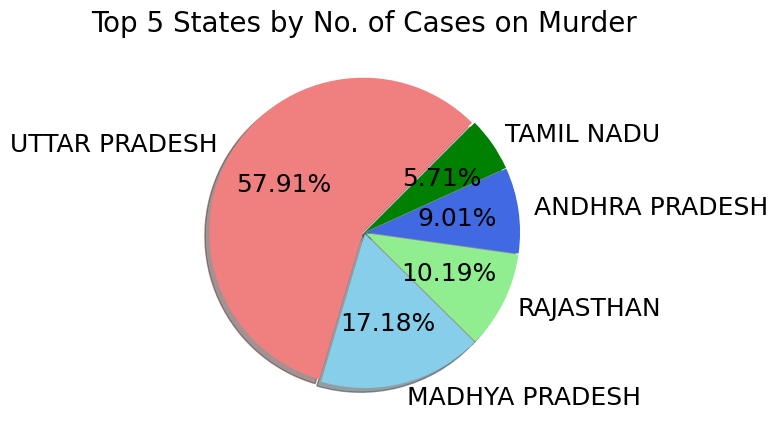

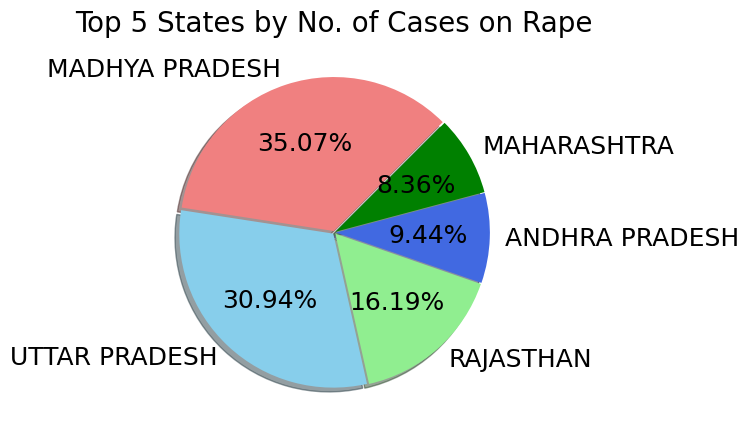

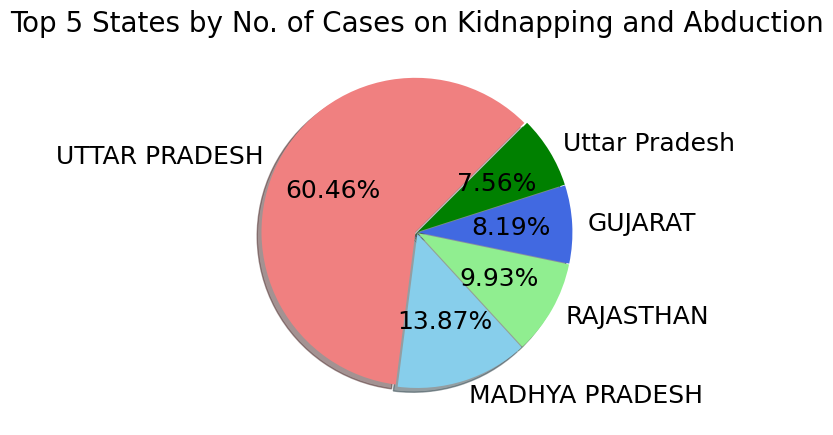

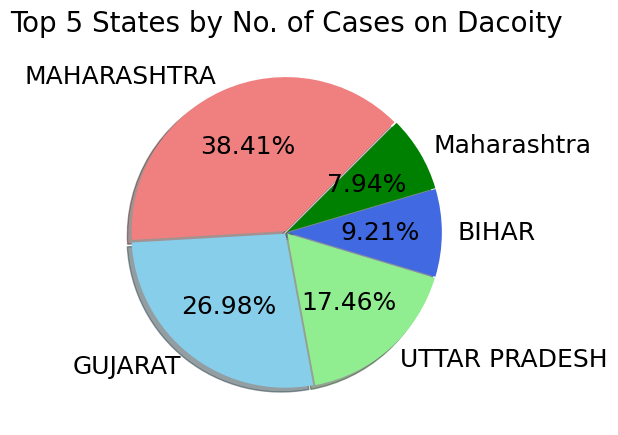

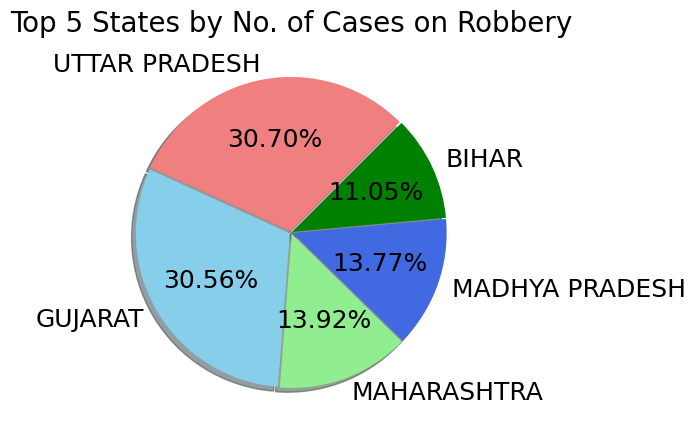

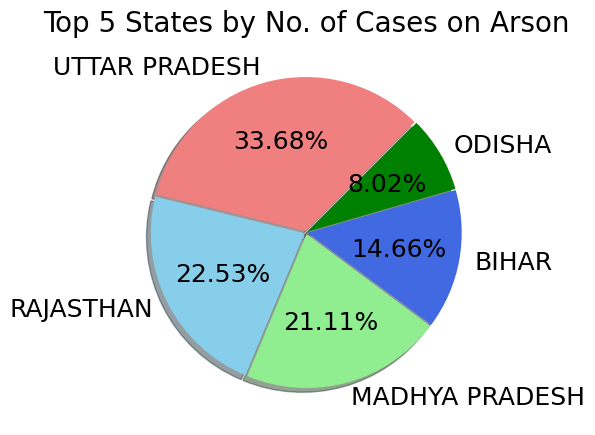

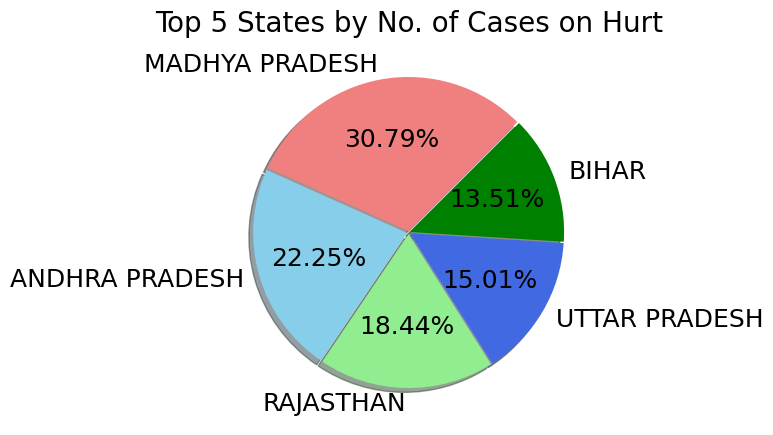

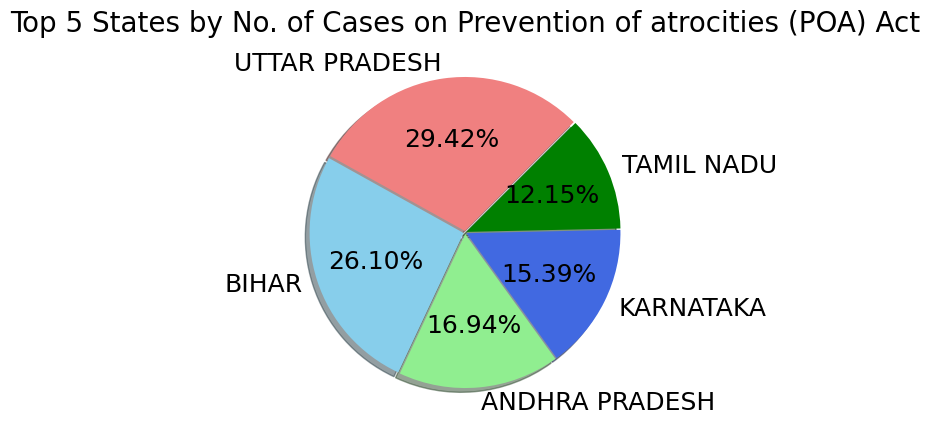

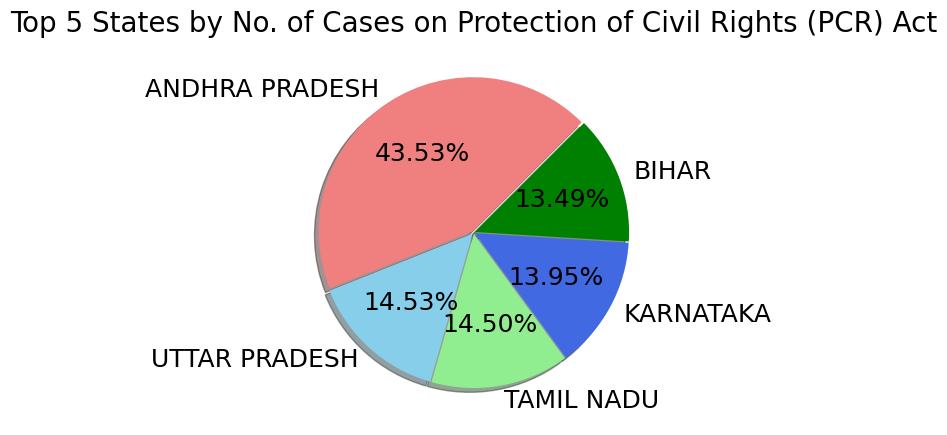

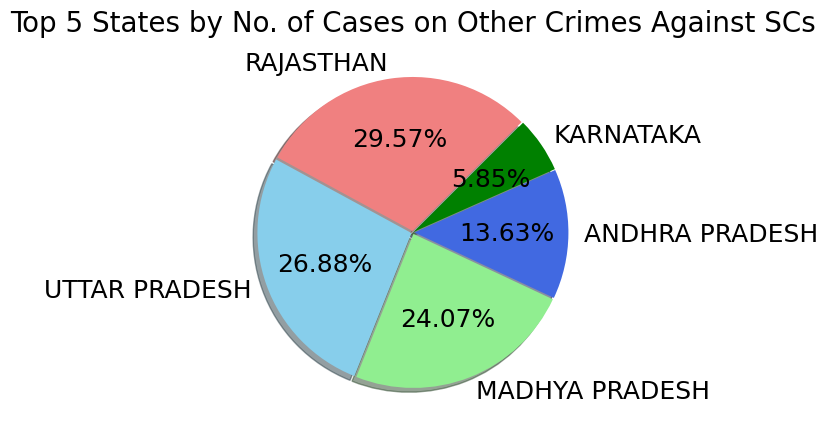

In [35]:
count=-1
for crime in crimes:
    count +=1
    top_crime_by_state=df_state.sort_values(by=crime,ascending=False)
    top_3crime=top_crime_by_state.iloc[:,count:count+1].head(5)
    plt.figure(figsize=(10,5))
    plt.pie(top_3crime[crime],labels=top_3crime.index,colors=['lightcoral','skyblue','lightgreen',"royalblue","green"],startangle=45,autopct='%1.2f%%',textprops={'fontsize': 18},shadow=True,explode=[0.01,0.01,0.01,0.01,0.01])
    plt.title("Top 5 States by No. of Cases on "+crime,fontdict={'fontsize' : 20})
    #plt.tight_layout()
    plt.show()

## Analysis of Top 5 States

In [36]:
top_5states=df_state.head(5).index
print(top_5states)

Index(['UTTAR PRADESH', 'RAJASTHAN', 'MADHYA PRADESH', 'ANDHRA PRADESH',
       'BIHAR'],
      dtype='object', name='STATE/UT')


In [37]:
df_state

,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,Total
STATE/UT,,,,,,,,,,,
UTTAR PRADESH,3569,3618,2223,55,214,710,4868,26248,501,34223,76229
RAJASTHAN,628,1893,365,1,33,475,5982,7511,7,37653,54548
MADHYA PRADESH,1059,4100,510,9,96,445,9989,2779,11,30644,49642
ANDHRA PRADESH,555,1104,235,9,38,136,7219,15111,1501,17354,43262
BIHAR,276,270,127,29,77,309,4383,23288,465,3753,32977
...,...,...,...,...,...,...,...,...,...,...,...
Mizoram,0,0,0,0,0,0,0,0,0,0,0
Meghalaya,0,0,0,0,0,0,0,0,0,0,0
A&N Islands,0,0,0,0,0,0,0,0,0,0,0


STATE/UT                              UTTAR PRADESH
Murder                                         3569
Rape                                           3618
Kidnapping and Abduction                       2223
Dacoity                                          55
Robbery                                         214
Arson                                           710
Hurt                                           4868
Prevention of atrocities (POA) Act            26248
Protection of Civil Rights (PCR) Act            501
Other Crimes Against SCs                      34223
Total                                         76229 

           STATE/UT         DISTRICT  Year  Murder  Rape  \
579   UTTAR PRADESH             AGRA  2001      11    15   
580   UTTAR PRADESH          ALIGARH  2001       8    12   
581   UTTAR PRADESH        ALLAHABAD  2001       6     9   
582   UTTAR PRADESH   AMBEDKAR NAGAR  2001       2     2   
583   UTTAR PRADESH          AURAIYA  2001       1     2   
...           

            STATE/UT        DISTRICT  Year  Murder  Rape  \
0     ANDHRA PRADESH        ADILABAD  2001       0     1   
1     ANDHRA PRADESH       ANANTAPUR  2001       0     4   
2     ANDHRA PRADESH        CHITTOOR  2001       3     3   
3     ANDHRA PRADESH        CUDDAPAH  2001       0     3   
4     ANDHRA PRADESH   EAST GODAVARI  2001       1     3   
...              ...             ...   ...     ...   ...   
8235  ANDHRA PRADESH   VISAKHAPATNAM  2012       2     4   
8236  ANDHRA PRADESH    VIZIANAGARAM  2012       1     6   
8237  ANDHRA PRADESH        WARANGAL  2012       2     6   
8238  ANDHRA PRADESH  WARANGAL URBAN  2012       0     1   
8239  ANDHRA PRADESH   WEST GODAVARI  2012       0    10   

      Kidnapping and Abduction  Dacoity  Robbery  Arson  Hurt  \
0                            4        0        0      0     3   
1                            0        0        0      0    49   
2                            0        0        0      0    38   
3                  

ValueError: Grouper and axis must be same length

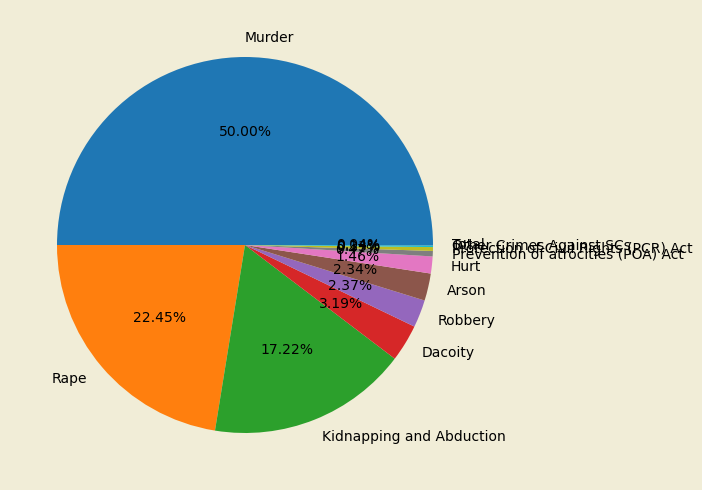

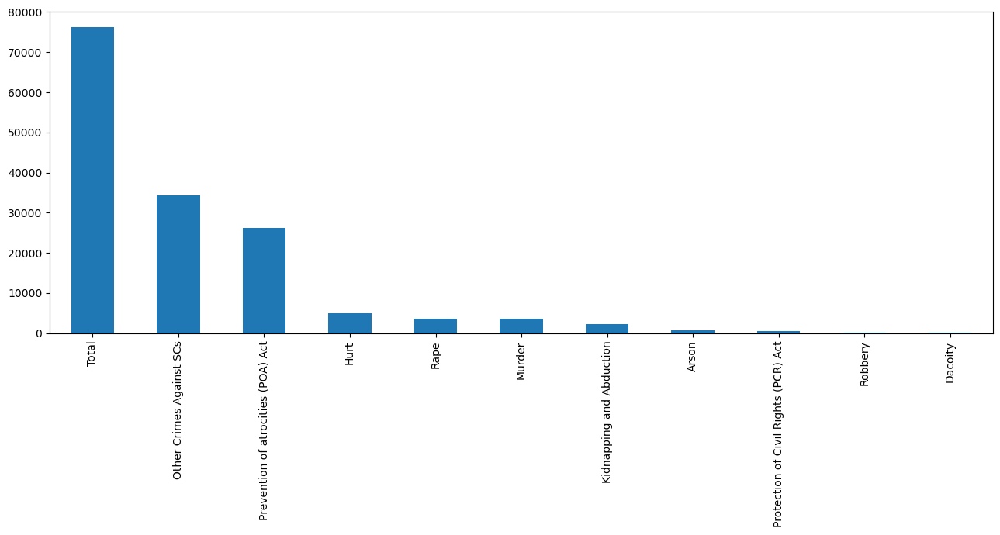

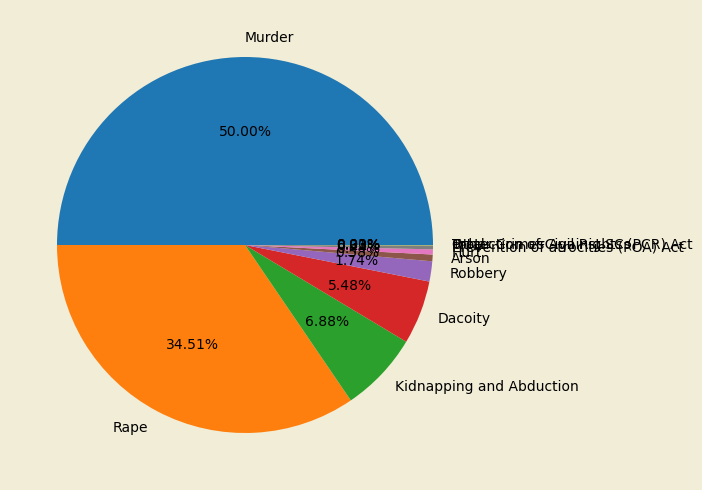

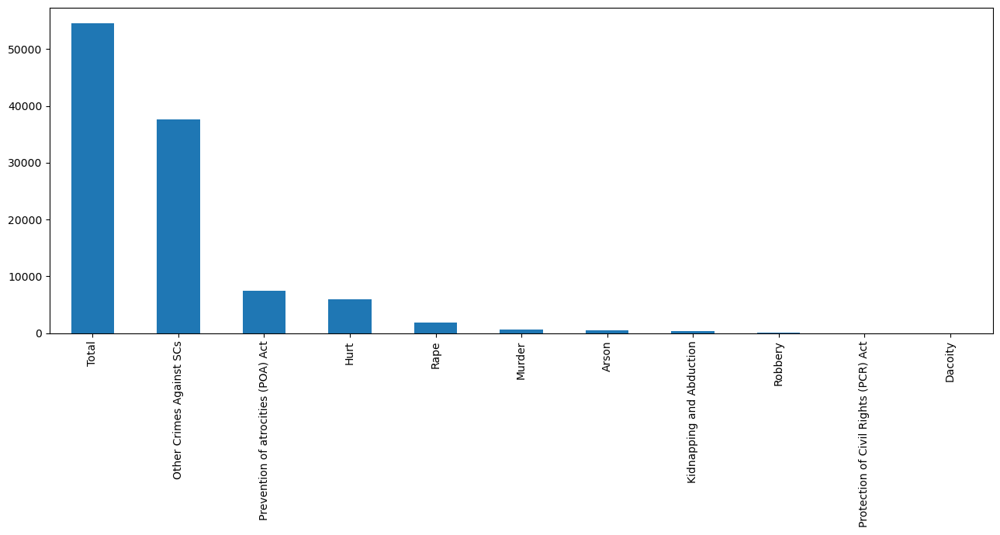

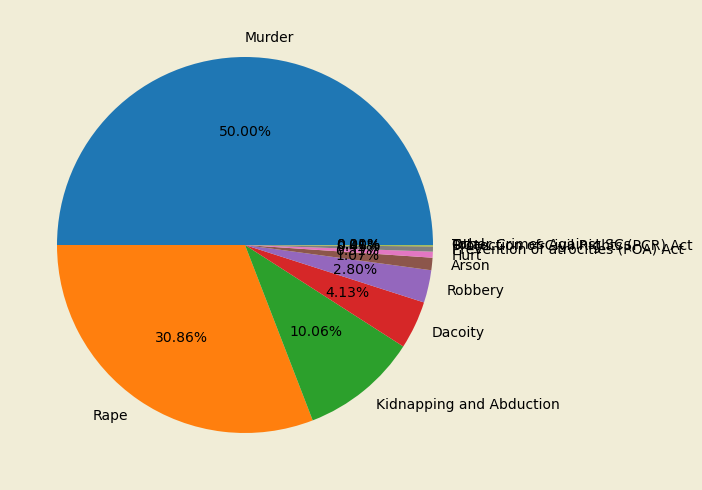

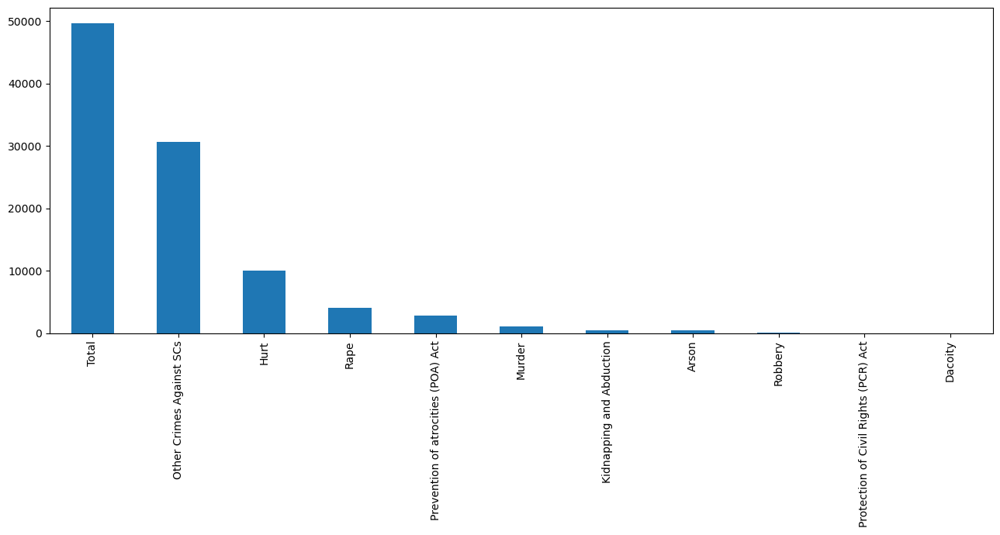

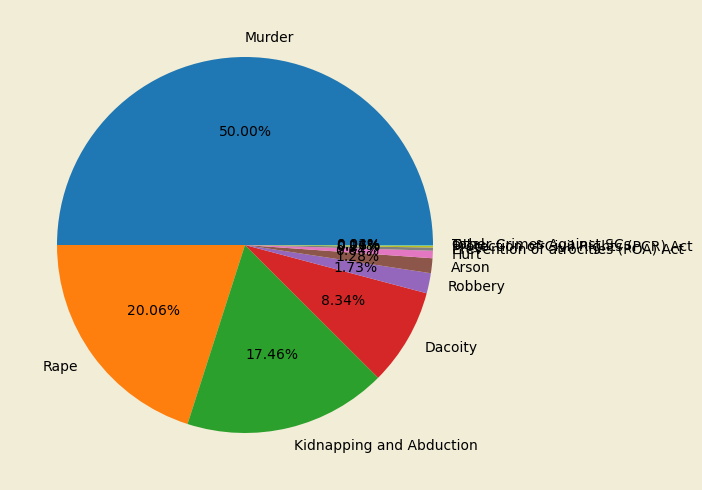

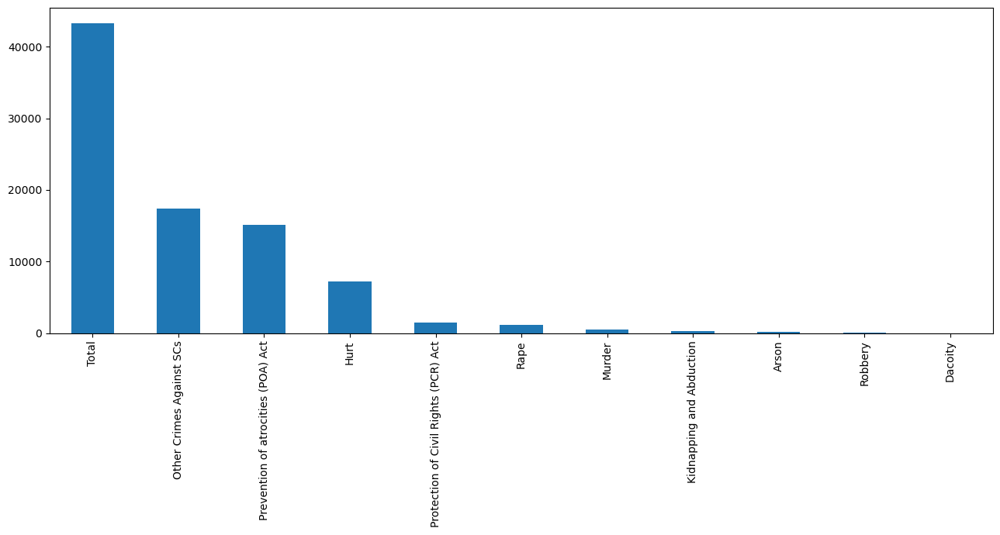

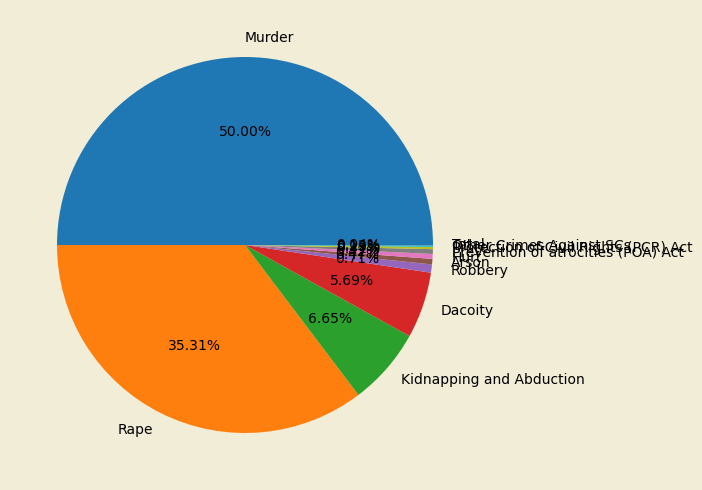

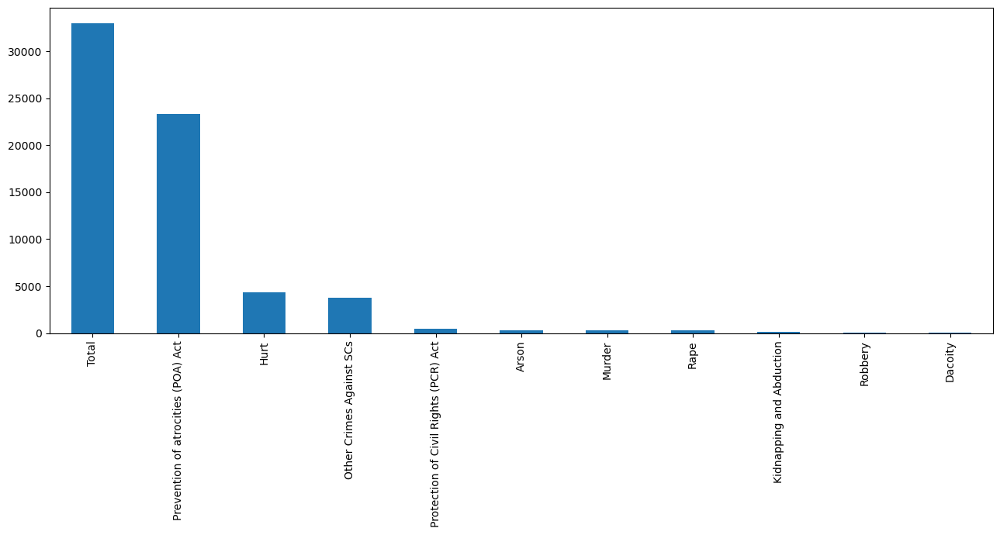

<Figure size 1000x500 with 0 Axes>

In [38]:
for state in top_5states:
    df_up=df_state.loc[df_state.index==state]
    dfupT=df_up.T#.drop("Total")
    print(dfupT,"\n")

  #Percentage Distribution of Crimes in Uttar Pradesh from 2001 to 2014
    plt.figure(figsize=(12,5)).patch.set_facecolor("#F1EDD7FF")
    plt.pie(dfupT[state].sort_values(ascending=False),labels=dfupT.index,autopct='%1.2f%%')
    plt.tight_layout()
    plt.figure(figsize=(13,7))
    dfupT.groupby(dfupT.index)[state].sum().sort_values(ascending=False).plot.bar()
    plt.tight_layout()

    df_state_year=Dist_df_crimes_final.loc[Dist_df_crimes_final['STATE/UT']==state]
    print(df_state_year,"\n")

  #Year Wise Distribution of Crimes in Uttar Pradesh
    df1_up_yearwise=pd.DataFrame()
    crimes_col=[x for x in crimes]
    #crimes_col.append("Total")
for i in crimes_col:
    df_crimes_up=df_state_year.groupby(['Year'])[i].sum()
    df1_up_yearwise[i]=df_crimes_up
    print(df1_up_yearwise)

    plt.figure(figsize=(10,5))
    sns.barplot(data=df1_up_yearwise,x=df1_up_yearwise.index,y=df_state["Total"],color="lightblue")
    plt.tight_layout()
  
  
    plt.figure(figsize=(10,5))
    sns.barplot(data=df1_up_yearwise,x=df1_up_yearwise.index,y=df_up[Total],color="lightblue")
    plt.tight_layout()

    plt.figure(figsize=(13,6)).patch.set_facecolor("#F1EDD7FF")
    plt.pie(df1_up_yearwise["Total"],labels=df1_up_yearwise.index,autopct='%1.2f%%',counterclock=False)
    plt.tight_layout()

  #Timeline Analysis of Different Categories of Crime at Different Period of Time
    plt.figure(figsize=(17,7)).patch.set_facecolor("#F1EDD7FF")
    sns.lineplot(data=df1_up_yearwise,palette='gnuplot_r',linestyle="dashed")
    plt.tight_layout()


In [39]:
print(df_up)

          Murder  Rape  Kidnapping and Abduction  Dacoity  Robbery  Arson  \
STATE/UT                                                                    
BIHAR        276   270                       127       29       77    309   

          Hurt  Prevention of atrocities (POA) Act  \
STATE/UT                                             
BIHAR     4383                               23288   

          Protection of Civil Rights (PCR) Act  Other Crimes Against SCs  \
STATE/UT                                                                   
BIHAR                                      465                      3753   

          Total  
STATE/UT         
BIHAR     32977  


In [40]:
print(dfupT)

STATE/UT                              BIHAR
Murder                                  276
Rape                                    270
Kidnapping and Abduction                127
Dacoity                                  29
Robbery                                  77
Arson                                   309
Hurt                                   4383
Prevention of atrocities (POA) Act    23288
Protection of Civil Rights (PCR) Act    465
Other Crimes Against SCs               3753
Total                                 32977
